In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os

Helper functions

In [10]:
def valid_file(filename):
    if filename.startswith('logcat') and filename.endswith('.csv'):
        return True
    else:
        return False
    
def read_and_prep_df(filename):
    df = pd.read_csv(filename)
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ms') 
    df['Timestamp'] = df['Timestamp'] - df['Timestamp'][0]
    df['power'] = (abs(df['BATTERY_PROPERTY_CURRENT_NOW'])/1000/1000) * (df['EXTRA_VOLTAGE']/1000)
    return df

Lineplots

/tmp/ipykernel_586479/197642692.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  boxes = boxes.append(pd.Series([0]*27, index=boxes.columns), ignore_index=True)
/tmp/ipykernel_586479/197642692.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(10, 1, figsize=(15, 50))


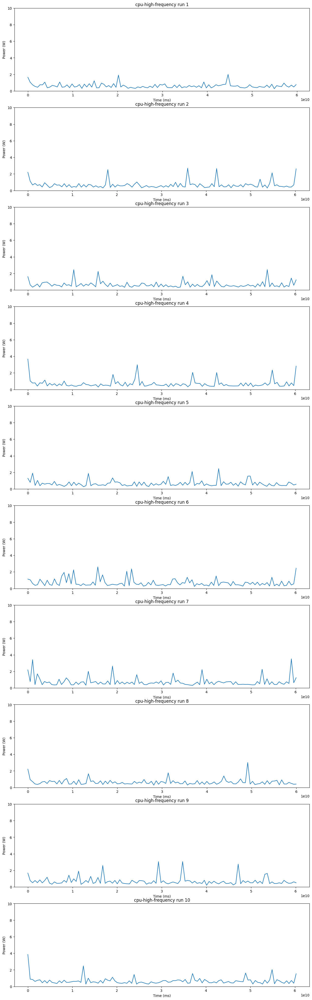

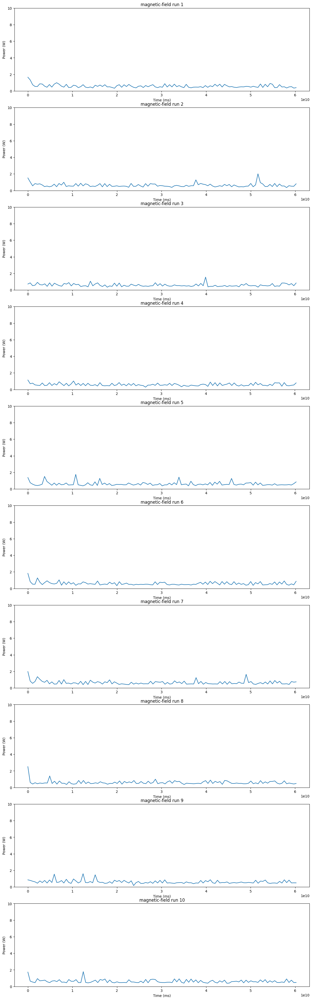

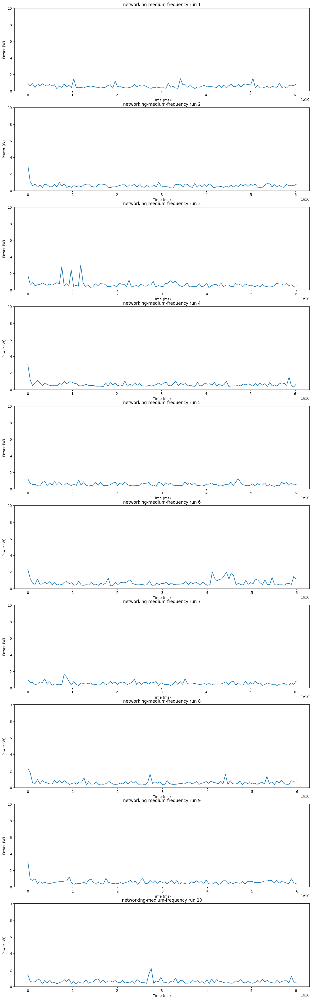

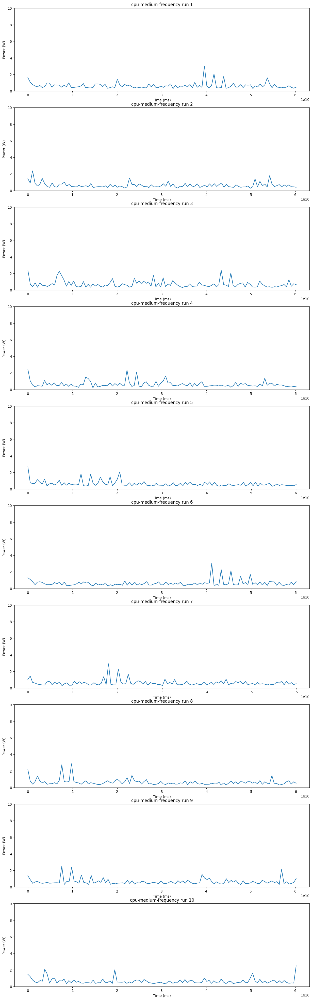

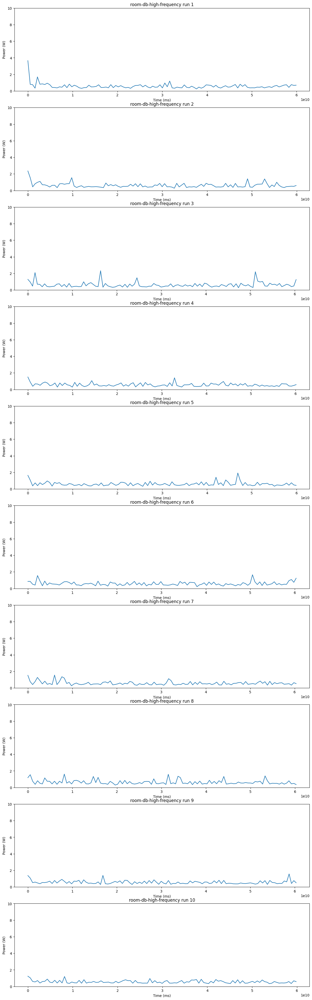

...

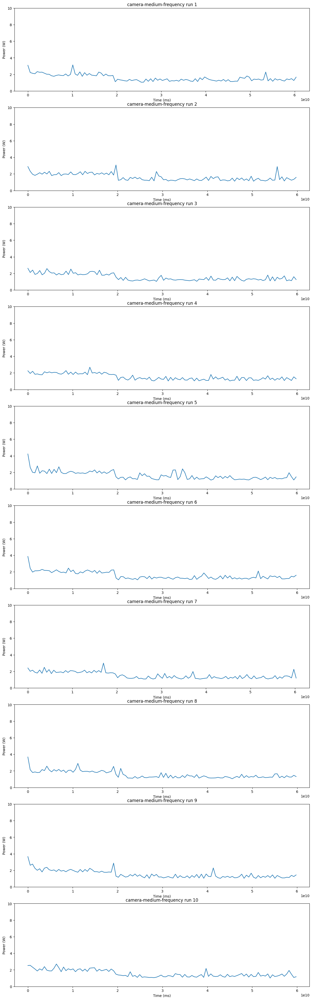

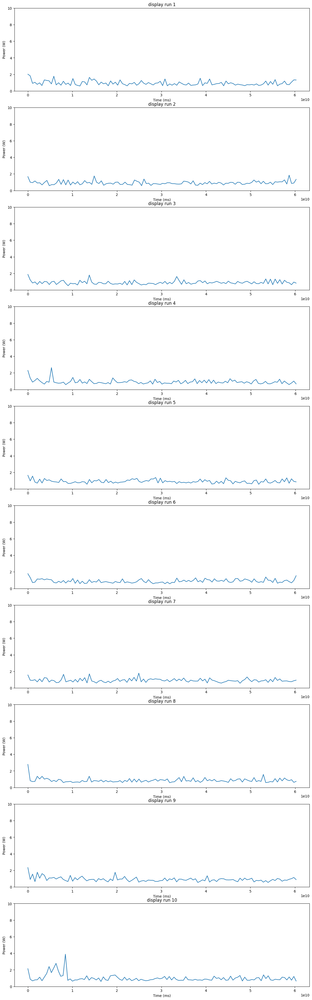

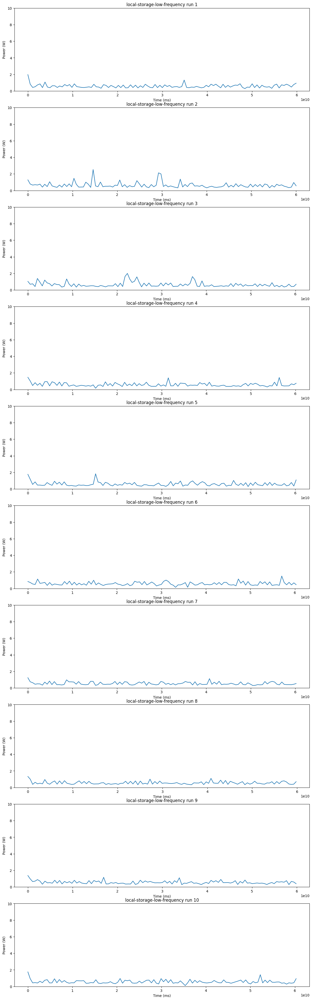

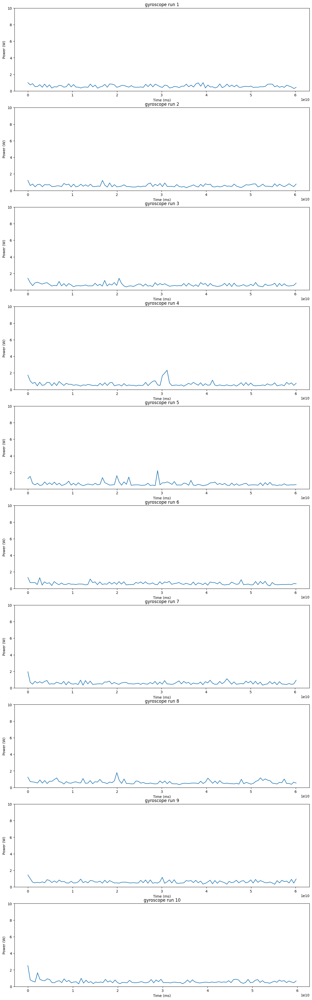

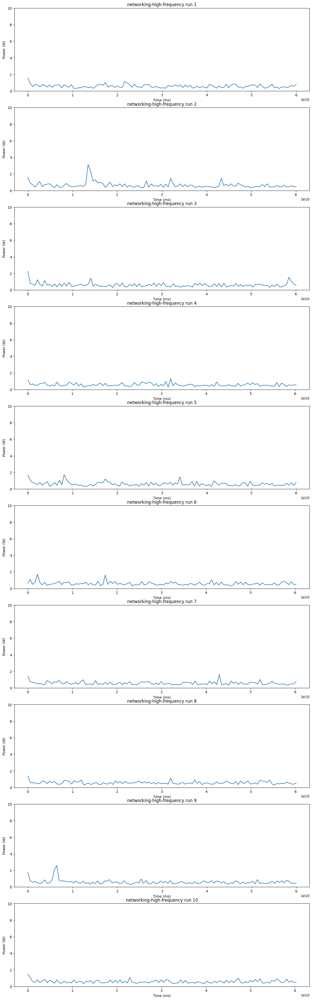

In [11]:
boxes = pd.DataFrame(columns=os.listdir('data'))
order = boxes.columns.sort_values()
for i in range(10):
    boxes = boxes.append(pd.Series([0]*27, index=boxes.columns), ignore_index=True)


for folder in os.listdir('data'):
    counter = 0
    fig, ax = plt.subplots(10, 1, figsize=(15, 50))
    for file in os.listdir('data/' + folder + '/batterymanager'):
        if valid_file(file):
            df = read_and_prep_df('data/' + folder + '/batterymanager/' + file)
            
            # lineplot of power over the run
            ax[counter].plot(df['Timestamp'].values, df['power'].values)
            ax[counter].set(xlabel='Time (ms)', ylabel='Power (W)', ylim=(0, 10))
            ax[counter].set_title(folder + ' run ' + str(counter + 1))
            
            # energy consumed over the run
            boxes[folder][counter] = np.trapz(df['power'].values, df['Timestamp'].values)

            counter += 1

    # save the lineplots        
    plt.savefig('out/lineplots/' + folder + '.pdf', format="pdf")


Boxplots

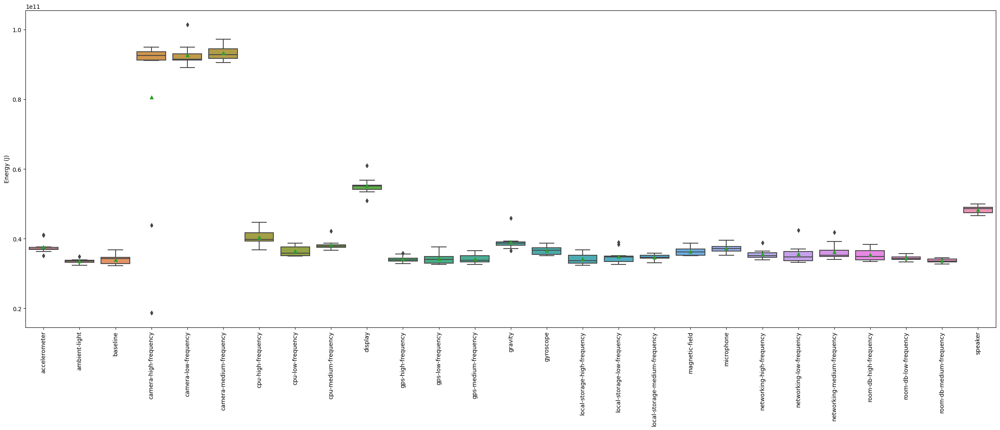

In [13]:
for col in boxes.columns:
    boxes[col] = boxes[col].astype(float)
    sns.boxplot(data=boxes[col], showmeans=True)
    plt.ylabel('Energy (J)')
    plt.savefig('out/boxplots/' + col + '.pdf', format="pdf")
    plt.close()

# big boxplot with all the apps
plt.figure(figsize=(30, 20))
sns.boxplot(data=boxes, showmeans=True, order=order.values.tolist())
plt.ylabel('Energy (J)')
plt.xticks(rotation = 90)
plt.gcf().subplots_adjust(bottom=0.5)

plt.savefig('out/boxplots/all.pdf', format="pdf")